<a href="https://colab.research.google.com/github/salilathalye/cwa-templates-pycaret/blob/main/CWA_Binary_Classification_PyCaret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<H1>Conversations with Austin</H1>
<h2>Multiple Regression Template
<p> Tested with PyCaret 2.2.3
<p>

Wait ... who is Austin, you ask? Austin the Apex Duck is my [Rubber Duck Debug buddy](https:en.wikipedia.org/wiki/Rubber_duck_debugging). Usually a pretty quiet type of guy, but I sense hidden depths of knowledge. Our chats usually start with me staring at something for a long time, then asking a question something like: "Hey Austin, what do you know about Kappa?". His usual response is: "Kappa? Tell me more, please". This usually starts a back and forth dialogue where he eggs (no pun intended!) me on to explain more. He's all about putting things in writing, which is why I'm sitting here taking notes which I'm cataloguing in a series called "Chats with Austin".

Salil Athalye
www.bokehboy.com


Data provided by [DPhi](https://dphi.tech//) Data Sprint #23: Used Cars Prices

https://dphi.tech/practice/challenge/59


# Configure Environment and Install Packages


In [ ]:
!pip install pycaret --quiet
!pip install mlflow --quiet



     |████████████████████████████████| 256kB 7.0MB/s 
     |████████████████████████████████| 174kB 24.2MB/s 
     |████████████████████████████████| 6.8MB 16.8MB/s 
     |████████████████████████████████| 1.8MB 53.6MB/s 
     |████████████████████████████████| 1.7MB 51.8MB/s 
     |████████████████████████████████| 65.8MB 54kB/s 
     |████████████████████████████████| 102kB 9.6MB/s 
     |████████████████████████████████| 276kB 49.8MB/s 
     |████████████████████████████████| 14.2MB 343kB/s 
     |████████████████████████████████| 157.5MB 86kB/s 
     |████████████████████████████████| 245kB 43.3MB/s 
     |████████████████████████████████| 2.1MB 37.7MB/s 
     |████████████████████████████████| 163kB 55.0MB/s 
     |████████████████████████████████| 153kB 57.2MB/s 
     |████████████████████████████████| 61kB 6.7MB/s 
     |████████████████████████████████| 81kB 7.6MB/s 
     |████████████████████████████████| 1.1MB 42.4MB/s 
     |████████████████████████████████| 348kB 44.5MB/s 

# Import Libraries


In [ ]:
from datetime import datetime
from datetime import timezone
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import imblearn
import json
from google.colab import files

#EDA



# PyCaret
import pycaret
from pycaret.regression import * 
from pycaret.utils import enable_colab
enable_colab()


# MLflow
import mlflow
#TODO: How to set up an MLflow server which we can use with Colab? 
#mlflow.set_tracking_uri('file:/c:/users/mlflow-server')



Colab mode enabled.


# Set Experiment Parameters


In [ ]:
EXPERIMENT_NAME = 'dphi_ch54_1'
SESSION_ID = 3435
DATA_SOURCE = "https://raw.githubusercontent.com/dphi-official/Datasets/master/used_car_price"
TRAINING_DATA = "train_set_label.csv"
TEST_DATA = "test_set_label.csv"
TARGET_COL = 'price_of_car'
# Set this to False when converting this notebook to a Productions script
VERBOSE = True
# Hyper-parameter search for model tuning
N_ITER = 10
# Should we download the run artifacts?
DOWNLOAD_ZIPFILE = True

In [ ]:
MODEL = 'TBD' # we will populate this with the best model later

dt = datetime.now()
dt.replace(tzinfo=timezone.utc)
utc_timestamp = dt.replace(tzinfo=timezone.utc).isoformat(timespec='seconds')
# Replace ':' and '-' and retain up to seconds
UTC_TIMESTAMP = utc_timestamp.replace(':','').replace('-',"")[:15]

TRAINING_DATA_PATH = DATA_SOURCE + '/' + TRAINING_DATA
TEST_DATA_PATH = DATA_SOURCE + '/' + TEST_DATA

# Load the data


In [ ]:
# Dataset is provided by DPhi
# raw.githubusercontent.com allows us to download 'raw' content of files stored on github

dtype_mapping = {}
training_index_col = None # specify the zero-indexed column that contains the index, or use None
test_index_col = None

if training_index_col:
  training_data  = pd.read_csv(TRAINING_DATA_PATH, dtype=dtype_mapping, index_col=[training_index_col])
else:
  training_data  = pd.read_csv(TRAINING_DATA_PATH, dtype=dtype_mapping)

if test_index_col:
  test_data = pd.read_csv(TEST_DATA_PATH, dtype=dtype_mapping, index_col=[test_index_col])
else:
  test_data = pd.read_csv(TEST_DATA_PATH, dtype=dtype_mapping)


# Save the raw data in case the source is unavailable later
training_data.to_csv(TRAINING_DATA, index=False)
test_data.to_csv(TEST_DATA, index=False)
# Save any decisions we took on dtype mapping so we can reuse this in other applications
with open('dtype_mapping.json','w') as f:
  json.dump(dtype_mapping, f)

###Data Description

<p>
About the Data
The dataset contains all relevant information that Craigslist provides on car sales including columns like price, condition, manufacturer, and more. Some of the features are listed below:

* year: entry year of the car
* car_price: entry price of the car (the target variable)
* manufacturer: manufacturer of the vehicle
* model_name: the model of the car that is listed
* fuel_type: fuel type that the listed car support
* #cylinders: number of cylinders
* odometer: miles travelled by vehicle
* title_status: title status of the vehicle
* vin: vehicle identification number
* drive: type of drive of the vehicle




In [ ]:
test_data.shape

(12500, 22)

In [ ]:
training_data.shape

(37500, 23)

### Compare Training Data Columns to Test Data Columns

In [ ]:
training_data.columns

Index(['region', 'region_url', 'year', 'manufacturer', 'model_name',
       'car_condition', '#cylinders', 'fuel_type', 'odometer', 'title_status',
       'transmission', 'vin', 'drive', 'size', 'car_type', 'car_color',
       'image_url', 'car_description', 'county', 'state', 'latitude',
       'longitude', 'price_of_car'],
      dtype='object')

In [ ]:
test_data_columns = test_data.columns
training_data_columns = training_data.columns
#Set difference : columns in training_data that are not in test_data
columns_missing_in_test = set(training_data_columns) - set(test_data_columns)
print(columns_missing_in_test)

{'price_of_car'}


In [ ]:
training_data.head(5)

,region,region_url,year,manufacturer,model_name,car_condition,#cylinders,fuel_type,odometer,title_status,transmission,vin,drive,size,car_type,car_color,image_url,car_description,county,state,latitude,longitude,price_of_car
0,san antonio,https://sanantonio.craigslist.org,2018.0,honda,accord ex-l,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,NaN,https://images.craigslist.org/00W0W_jPnECYbxWm...,"Price: $24,900 Miles: 31,269 Engine: 1.5L Turb...",NaN,tx,29.5407,-98.5521,24900
1,augusta,https://augusta.craigslist.org,2006.0,ford,f250 super duty diesel,excellent,NaN,diesel,169438.0,clean,automatic,NaN,rwd,full-size,truck,white,https://images.craigslist.org/00U0U_5ROtvUdu72...,2006 Ford F250 Lariat SuperDuty Crew Cab 4 doo...,NaN,ga,33.5161,-82.0785,0
2,hickory / lenoir,https://hickory.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc,NaN,NaN,4500
3,fargo / moorhead,https://fargo.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mn,NaN,NaN,20000
4,los angeles,https://losangeles.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ca,NaN,NaN,0


In [ ]:
training_data.sample(25)

,region,region_url,year,manufacturer,model_name,car_condition,#cylinders,fuel_type,odometer,title_status,transmission,vin,drive,size,car_type,car_color,image_url,car_description,county,state,latitude,longitude,price_of_car
30156,ft myers / SW florida,https://fortmyers.craigslist.org,2012.0,lincoln,mkz,NaN,NaN,gas,33712.0,clean,automatic,3LNHL2GC8CR807792,NaN,NaN,sedan,NaN,https://images.craigslist.org/00J0J_hgabnfA8aM...,2012 Lincoln MKZ FWD ☎ 239-226-1030 Call or Te...,NaN,fl,26.5457,-81.8009,12997
9499,"washington, DC",https://washingtondc.craigslist.org,2015.0,hyundai,veloster,NaN,NaN,gas,44509.0,clean,automatic,KMHTC6AD2FU231908,NaN,compact,coupe,NaN,https://images.craigslist.org/00q0q_4ThQmBr5ZU...,2015 HYUNDAI VELOSTER Offered by: Guarante...,NaN,dc,38.5114,-77.3689,0
12633,minneapolis / st paul,https://minneapolis.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mn,NaN,NaN,1500
15577,san diego,https://sandiego.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ca,NaN,NaN,0
34211,kalispell,https://kalispell.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mt,NaN,NaN,46999
16041,corvallis/albany,https://corvallis.craigslist.org,2002.0,hyundai,elantra gls,excellent,4 cylinders,gas,96173.0,clean,automatic,NaN,fwd,mid-size,sedan,white,https://images.craigslist.org/00B0B_xGLSidNynB...,TO OUR VALUED CUSTOMERS!!!!! YOU- -US ...,NaN,or,44.0460,-122.9770,999
11752,stockton,https://stockton.craigslist.org,2019.0,ram,1500 crew cab laramie pickup,good,6 cylinders,gas,13070.0,clean,other,1C6RRFJG5KN780490,4wd,NaN,pickup,red,https://images.craigslist.org/00G0G_jwk1Y54chP...,Carvana is the safer way to buy a car During t...,NaN,ca,33.7865,-84.4454,41990
390,san diego,https://sandiego.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ca,NaN,NaN,24900
27248,louisville,https://louisville.craigslist.org,2017.0,hyundai,elantra,NaN,NaN,gas,20976.0,clean,automatic,KMHD84LF5HU335935,fwd,NaN,sedan,silver,https://images.craigslist.org/00O0O_ikOFMCkJ0P...,Byerly Super Store (Ford Nissan) address: 4...,NaN,ky,38.1895,-85.8090,0
34705,jacksonville,https://jacksonville.craigslist.org,2006.0,ford,fusion,NaN,NaN,gas,NaN,clean,manual,NaN,NaN,NaN,NaN,NaN,https://images.craigslist.org/00R0R_JeRLXdFMje...,2006 Ford Fusion- -DEALMAKER AUTO SALES - BEST...,NaN,fl,30.4360,-81.6426,2195


In [ ]:
training_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37500 entries, 0 to 37499
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   region           37500 non-null  object 
 1   region_url       37500 non-null  object 
 2   year             21525 non-null  float64
 3   manufacturer     20604 non-null  object 
 4   model_name       21326 non-null  object 
 5   car_condition    11140 non-null  object 
 6   #cylinders       12832 non-null  object 
 7   fuel_type        21409 non-null  object 
 8   odometer         17571 non-null  float64
 9   title_status     21468 non-null  object 
 10  transmission     21503 non-null  object 
 11  vin              12020 non-null  object 
 12  drive            14942 non-null  object 
 13  size             6548 non-null   object 
 14  car_type         16174 non-null  object 
 15  car_color        14378 non-null  object 
 16  image_url        21601 non-null  object 
 17  car_descript

In [ ]:
training_data.isna().sum()

region                 0
region_url             0
year               15975
manufacturer       16896
model_name         16174
car_condition      26360
#cylinders         24668
fuel_type          16091
odometer           19929
title_status       16032
transmission       15997
vin                25480
drive              22558
size               30952
car_type           21326
car_color          23122
image_url          15899
car_description    15899
county             37500
state                  0
latitude           16268
longitude          16268
price_of_car           0
dtype: int64

In [ ]:
training_data.describe()

,year,odometer,county,latitude,longitude,price_of_car
count,21525.000000,1.757100e+04,0.0,21232.000000,21232.000000,3.750000e+04
mean,2010.141417,9.728570e+04,NaN,37.472843,-94.438136,1.489380e+04
std,9.629504,8.549977e+04,NaN,6.944689,17.857313,1.099009e+05
min,1900.000000,0.000000e+00,NaN,-15.342700,-158.600000,0.000000e+00
25%,2007.000000,4.349350e+04,NaN,32.554275,-109.427500,4.200000e+03
50%,2012.000000,8.967900e+04,NaN,37.663250,-87.889500,9.990000e+03
75%,2016.000000,1.358370e+05,NaN,42.777800,-80.669200,1.900000e+04
max,2021.000000,3.000000e+06,NaN,64.993700,36.082300,1.850000e+07


In [ ]:
training_data[TARGET_COL].value_counts()

0        3242
3500      359
2500      318
6500      299
4500      285
         ... 
2230        1
33948       1
16575       1
32967       1
8188        1
Name: price_of_car, Length: 4763, dtype: int64

# Perform Basic Exploratory Data Analysis


In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(training_data, title='Pandas Profiling Report', explorative=True)
profile.to_file("training_data_profile.html")
profile.to_notebook_iframe()

In [ ]:
categorical_cols = training_data.select_dtypes(include='object').columns
categorical_cols

Index(['region', 'region_url', 'manufacturer', 'model_name', 'car_condition',
       '#cylinders', 'fuel_type', 'title_status', 'transmission', 'vin',
       'drive', 'size', 'car_type', 'car_color', 'image_url',
       'car_description', 'state'],
      dtype='object')

In [ ]:
def categorical_summary(df):
  '''
  Adapted from https://www.kaggle.com/nextbigwhat/eda-for-categorical-variables-part-2

  Returns a dataframe containing information about categorical columns
  Column name is set as the index
  '''
  categorical_cols = df.select_dtypes(include='object').columns
  summary_df = pd.DataFrame(columns=
      [
       'column',
       'values',
       'count',
       'has_nan',
       'missing',
       'pct_missing',
      ]
  )
  summary = pd.DataFrame()
  for col in categorical_cols:
    summary['column'] = [col]
    summary['values'] = [df[col].unique()]
    summary['has_nan']= [df[col].isna().any()]
    summary['count'] = len(list(df[col].unique()))
    summary['missing'] = df[col].isna().sum()
    summary['pct_missing'] = ((df[col].isna().sum())/(df.shape[0])).round(3)*100

    summary_df = summary_df.append(summary)
  summary_df.set_index('column', inplace=True)
  return summary_df


In [ ]:
categorical_summary(training_data)

,values,count,has_nan,missing,pct_missing
column,,,,,
region,"[san antonio, augusta, hickory / lenoir, fargo...",238,False,0,0.0
region_url,"[https://sanantonio.craigslist.org, https://au...",242,False,0,0.0
manufacturer,"[honda, ford, nan, toyota, dodge, kia, chevrol...",42,True,16896,45.1
model_name,"[accord ex-l, f250 super duty diesel, nan, pri...",5399,True,16174,43.1
car_condition,"[nan, excellent, good, like new, fair, new, sa...",7,True,26360,70.3
#cylinders,"[nan, 4 cylinders, 6 cylinders, 8 cylinders, 1...",9,True,24668,65.8
fuel_type,"[gas, diesel, nan, hybrid, other, electric]",6,True,16091,42.9
title_status,"[clean, nan, salvage, lien, rebuilt, missing, ...",7,True,16032,42.8
transmission,"[automatic, nan, manual, other]",4,True,15997,42.7


In [ ]:
def plot_correlaton_heatmap(df):
  numeric_cols = df.select_dtypes(exclude='object').columns
  plt.figure(figsize=(10,8)) 
  sns.heatmap(df[numeric_cols].corr(), cmap='RdBu_r', annot=True) 
  print(plt.show())

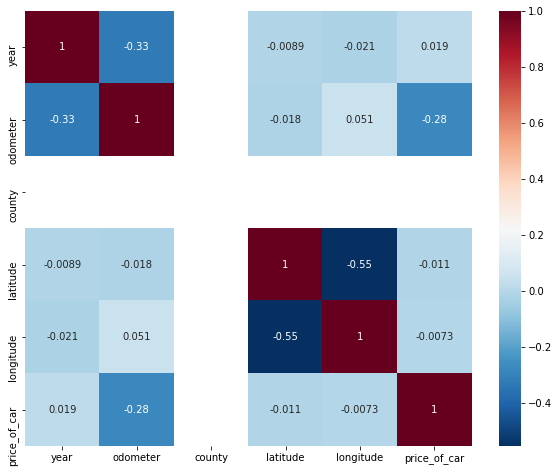

None


In [ ]:
plot_correlaton_heatmap(training_data)

In [ ]:
training_data.drop_duplicates(inplace=True)
training_data.shape

(29957, 23)

# Set up the Experiment
### Notes
* Only set silent=True when you are sure that PyCaret has interpreted the type of each feature correctly. Also remember that if use the default (silent=False), **PyCaret will pause here**, waiting for user confirmation!!!
* When you migrate to Production in the form of a Python script then set html=False.


In [ ]:
experiment = setup(training_data, 
                    target = TARGET_COL, 
                    session_id=SESSION_ID, 
                    normalize = True,
                    transformation = True,
                    multicollinearity_threshold = 0.95,
                    iterative_imputation_iters = 5,
                    fold_strategy='stratifiedkfold',
                    high_cardinality_features = ['model_name','state','manufacturer','region'],
                    ignore_features=['car_description','vin','image_url','region_url'],
                    log_experiment = True,       # sets up MLflow using local files
                    log_plots=True,
                    log_data=True,
                    experiment_name = EXPERIMENT_NAME,
                    profile=False,
                    silent=True,                 # set to True only when you confirm feature types selected by PyCaret
                    html=True                  # set to False when converting this to a Production script
                   )

,Description,Value
0,session_id,3435
1,Target,price_of_car
2,Original Data,"(29957, 23)"
3,Missing Values,True
4,Numeric Features,4
5,Categorical Features,14
6,Ordinal Features,False
7,High Cardinality Features,True
8,High Cardinality Method,frequency
9,Transformed Train Set,"(20969, 77)"


#PyCaret Pipeline
PyCaret creates a Pipeline behind the scenes. Using get_config() we can output a description of the steps in the Pipeline.
<p>
TODO: Figure out how to save the pipeline description to JSON, perhaps?

In [ ]:
prep_pipe = get_config('prep_pipe')

In [ ]:
prep_pipe

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['car_description', 'vin',
                                                       'image_url',
                                                       'region_url'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='price_of_car',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categ...
                                                  target='price_of_car')),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluster_all', 'passthrough'),
     

# Feature Transformations
Review how PyCaret has transformed Features and the Target looking only at the training data to avoid data leakage.
This is useful when we start developing the front-end and the API so we can be specific on what categorical values are allowed.
<p>
TODO: Seems like we have to infer what transformations were made to each Feature. Would like to see something like col_a was Normalized, col_b was One Hot Encoded etc.

In [ ]:
transformed_training_features = get_config('X_train')

In [ ]:
transformed_training_features.head()

,region,year,manufacturer,model_name,odometer,state,latitude,longitude,car_condition_excellent,car_condition_fair,car_condition_good,car_condition_like new,car_condition_new,car_condition_not_available,car_condition_salvage,#cylinders_10 cylinders,#cylinders_12 cylinders,#cylinders_3 cylinders,#cylinders_4 cylinders,#cylinders_5 cylinders,#cylinders_6 cylinders,#cylinders_8 cylinders,#cylinders_not_available,#cylinders_other,fuel_type_diesel,fuel_type_electric,fuel_type_gas,fuel_type_hybrid,fuel_type_not_available,fuel_type_other,title_status_clean,title_status_lien,title_status_missing,title_status_not_available,title_status_parts only,title_status_rebuilt,title_status_salvage,transmission_automatic,transmission_manual,transmission_not_available,transmission_other,drive_4wd,drive_fwd,drive_not_available,drive_rwd,size_compact,size_full-size,size_mid-size,size_not_available,size_sub-compact,car_type_SUV,car_type_bus,car_type_convertible,car_type_coupe,car_type_hatchback,car_type_mini-van,car_type_not_available,car_type_offroad,car_type_other,car_type_pickup,car_type_sedan,car_type_truck,car_type_van,car_type_wagon,car_color_black,car_color_blue,car_color_brown,car_color_custom,car_color_green,car_color_grey,car_color_not_available,car_color_orange,car_color_purple,car_color_red,car_color_silver,car_color_white,car_color_yellow
17157,0.097702,-0.293205,1.313431,1.538424,0.172727,-0.050859,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
30068,-0.650684,1.954184,-0.744485,-0.500661,-1.559376,-1.284675,0.415548,0.664574,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
27468,-1.041525,-0.293205,1.313431,1.538424,0.172727,1.497663,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
28627,0.216906,-0.293205,1.313431,1.538424,0.172727,-0.982913,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
29207,-0.526894,-0.293205,1.313431,1.538424,0.172727,1.497663,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
transformed_training_features.iloc[0]

region              0.097702
year               -0.293205
manufacturer        1.313431
model_name          1.538424
odometer            0.172727
                      ...   
car_color_purple    0.000000
car_color_red       0.000000
car_color_silver    0.000000
car_color_white     0.000000
car_color_yellow    0.000000
Name: 17157, Length: 77, dtype: float32

#Evaluate, Select and Tune Model

## Compare Models


In [ ]:
# return best model based on F1
best = compare_models(fold=5) #default is 'Accuracy'

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
huber,Huber Regressor,9.887337e+03,2.140330e+10,9.979507e+04,7.650000e-02,2.7364,5.600800e+01,1.544
par,Passive Aggressive Regressor,9.873604e+03,2.140283e+10,9.983513e+04,7.210000e-02,2.7326,5.278890e+01,0.454
en,Elastic Net,1.158666e+04,2.140908e+10,1.001641e+05,3.740000e-02,2.7960,7.157710e+01,0.076
br,Bayesian Ridge,1.170554e+04,2.142072e+10,1.002659e+05,2.770000e-02,2.8027,7.099910e+01,0.212
omp,Orthogonal Matching Pursuit,1.257193e+04,2.145407e+10,1.009010e+05,-3.980000e-02,2.8195,7.136110e+01,0.068
llar,Lasso Least Angle Regression,1.317358e+04,2.147432e+10,1.013948e+05,-9.530000e-02,2.8460,7.651020e+01,0.078
lasso,Lasso Regression,1.359662e+04,2.149402e+10,1.017512e+05,-1.365000e-01,2.8532,7.841630e+01,0.626
ridge,Ridge Regression,1.360332e+04,2.149430e+10,1.017539e+05,-1.368000e-01,2.8531,7.861150e+01,0.064
lr,Linear Regression,1.361072e+04,2.149464e+10,1.017599e+05,-1.375000e-01,2.8532,7.864770e+01,0.296
lightgbm,Light Gradient Boosting Machine,1.316957e+04,2.291349e+10,1.194392e+05,-3.866500e+00,2.7139,6.593690e+01,0.326


In [ ]:
compare_model_results = pull()
compare_model_results.to_csv('compare_model.csv', index=False)

In [ ]:
TOPN = 3
top_models = compare_models(fold=5, n_select=TOPN, turbo=True, exclude=['catboost'])
tuned_top_models = [tune_model(i, n_iter=N_ITER) for i in top_models]
stacked_model = stack_models(tuned_top_models, meta_model=top_models[0], verbose=False)
blended_model = blend_models(tuned_top_models, verbose=False)
finalized_automl_model = automl() # returns a finalized model


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,10574.1289,3.715076e+08,19274.5312,0.0811,2.7869,65.7711
1,10286.4492,2.359656e+08,15361.1709,0.1120,2.8221,72.5938
2,10325.9707,2.528549e+08,15901.4131,0.0924,2.8088,71.4858
3,10999.7676,1.292247e+09,35947.8359,0.0259,2.8109,73.4390
4,14271.2432,4.769481e+10,218391.4219,0.0005,2.7974,79.6329
5,18168.0684,1.631693e+11,403942.1562,-0.0005,2.7646,67.5738
6,10312.2861,2.981530e+08,17267.1055,0.0939,2.7738,62.9253
7,10273.4482,2.550619e+08,15970.6562,0.0741,2.8225,87.0258
8,9952.8926,1.970603e+08,14037.8154,0.1242,2.7953,64.7745
9,10398.1641,3.080959e+08,17552.6621,0.1009,2.7794,62.8765


In [ ]:
predict_model(stacked_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,8272.5263,2.283473e+08,15111.1643,0.1614,2.6076,59.9372


,region,year,manufacturer,model_name,odometer,state,latitude,longitude,car_condition_excellent,car_condition_fair,car_condition_good,car_condition_like new,car_condition_new,car_condition_not_available,car_condition_salvage,#cylinders_10 cylinders,#cylinders_12 cylinders,#cylinders_3 cylinders,#cylinders_4 cylinders,#cylinders_5 cylinders,#cylinders_6 cylinders,#cylinders_8 cylinders,#cylinders_not_available,#cylinders_other,fuel_type_diesel,fuel_type_electric,fuel_type_gas,fuel_type_hybrid,fuel_type_not_available,fuel_type_other,title_status_clean,title_status_lien,title_status_missing,title_status_not_available,title_status_parts only,title_status_rebuilt,title_status_salvage,transmission_automatic,transmission_manual,transmission_not_available,transmission_other,drive_4wd,drive_fwd,drive_not_available,drive_rwd,size_compact,size_full-size,size_mid-size,size_not_available,size_sub-compact,car_type_SUV,car_type_bus,car_type_convertible,car_type_coupe,car_type_hatchback,car_type_mini-van,car_type_not_available,car_type_offroad,car_type_other,car_type_pickup,car_type_sedan,car_type_truck,car_type_van,car_type_wagon,car_color_black,car_color_blue,car_color_brown,car_color_custom,car_color_green,car_color_grey,car_color_not_available,car_color_orange,car_color_purple,car_color_red,car_color_silver,car_color_white,car_color_yellow,price_of_car,Label
0,-0.572110,-0.293205,1.313431,1.538424,0.172727,-0.692940,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7880.0,13152.422312
1,0.576803,-0.967927,-0.999652,-0.691835,0.172727,-0.795349,-1.312126,-0.486336,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,17000.0,22221.503586
2,-0.784560,-0.740115,-0.999652,-0.689377,-2.570480,1.047610,-1.687373,1.005744,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9500.0,23012.736073
3,0.683508,-0.313631,-1.126138,-0.691835,-0.555960,0.166806,1.156655,-1.597043,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,19995.0,12173.427127
4,-0.928953,-0.967927,-1.165996,-0.691835,0.283527,-0.050859,1.121808,-0.108863,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3500.0,6652.251242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8983,-1.317456,-0.293205,1.313431,1.538424,0.172727,-0.231518,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1450.0,13089.721870
8984,-0.463103,1.316849,-0.061663,-0.580929,0.430025,1.04

In [ ]:
predict_model(blended_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,8512.5991,2.256201e+08,15020.6572,0.1714,2.619,66.0833


,region,year,manufacturer,model_name,odometer,state,latitude,longitude,car_condition_excellent,car_condition_fair,car_condition_good,car_condition_like new,car_condition_new,car_condition_not_available,car_condition_salvage,#cylinders_10 cylinders,#cylinders_12 cylinders,#cylinders_3 cylinders,#cylinders_4 cylinders,#cylinders_5 cylinders,#cylinders_6 cylinders,#cylinders_8 cylinders,#cylinders_not_available,#cylinders_other,fuel_type_diesel,fuel_type_electric,fuel_type_gas,fuel_type_hybrid,fuel_type_not_available,fuel_type_other,title_status_clean,title_status_lien,title_status_missing,title_status_not_available,title_status_parts only,title_status_rebuilt,title_status_salvage,transmission_automatic,transmission_manual,transmission_not_available,transmission_other,drive_4wd,drive_fwd,drive_not_available,drive_rwd,size_compact,size_full-size,size_mid-size,size_not_available,size_sub-compact,car_type_SUV,car_type_bus,car_type_convertible,car_type_coupe,car_type_hatchback,car_type_mini-van,car_type_not_available,car_type_offroad,car_type_other,car_type_pickup,car_type_sedan,car_type_truck,car_type_van,car_type_wagon,car_color_black,car_color_blue,car_color_brown,car_color_custom,car_color_green,car_color_grey,car_color_not_available,car_color_orange,car_color_purple,car_color_red,car_color_silver,car_color_white,car_color_yellow,price_of_car,Label
0,-0.572110,-0.293205,1.313431,1.538424,0.172727,-0.692940,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7880.0,14945.582267
1,0.576803,-0.967927,-0.999652,-0.691835,0.172727,-0.795349,-1.312126,-0.486336,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,17000.0,21373.095355
2,-0.784560,-0.740115,-0.999652,-0.689377,-2.570480,1.047610,-1.687373,1.005744,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9500.0,23021.391772
3,0.683508,-0.313631,-1.126138,-0.691835,-0.555960,0.166806,1.156655,-1.597043,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,19995.0,13143.698138
4,-0.928953,-0.967927,-1.165996,-0.691835,0.283527,-0.050859,1.121808,-0.108863,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3500.0,8918.457886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8983,-1.317456,-0.293205,1.313431,1.538424,0.172727,-0.231518,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1450.0,15083.274121
8984,-0.463103,1.316849,-0.061663,-0.580929,0.430025,1.04

In [ ]:
predict_model(finalized_automl_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,8361.908,2.234557e+08,14948.4354,0.1793,2.6088,62.7648


,region,year,manufacturer,model_name,odometer,state,latitude,longitude,car_condition_excellent,car_condition_fair,car_condition_good,car_condition_like new,car_condition_new,car_condition_not_available,car_condition_salvage,#cylinders_10 cylinders,#cylinders_12 cylinders,#cylinders_3 cylinders,#cylinders_4 cylinders,#cylinders_5 cylinders,#cylinders_6 cylinders,#cylinders_8 cylinders,#cylinders_not_available,#cylinders_other,fuel_type_diesel,fuel_type_electric,fuel_type_gas,fuel_type_hybrid,fuel_type_not_available,fuel_type_other,title_status_clean,title_status_lien,title_status_missing,title_status_not_available,title_status_parts only,title_status_rebuilt,title_status_salvage,transmission_automatic,transmission_manual,transmission_not_available,transmission_other,drive_4wd,drive_fwd,drive_not_available,drive_rwd,size_compact,size_full-size,size_mid-size,size_not_available,size_sub-compact,car_type_SUV,car_type_bus,car_type_convertible,car_type_coupe,car_type_hatchback,car_type_mini-van,car_type_not_available,car_type_offroad,car_type_other,car_type_pickup,car_type_sedan,car_type_truck,car_type_van,car_type_wagon,car_color_black,car_color_blue,car_color_brown,car_color_custom,car_color_green,car_color_grey,car_color_not_available,car_color_orange,car_color_purple,car_color_red,car_color_silver,car_color_white,car_color_yellow,price_of_car,Label
0,-0.572110,-0.293205,1.313431,1.538424,0.172727,-0.692940,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7880.0,14487.375014
1,0.576803,-0.967927,-0.999652,-0.691835,0.172727,-0.795349,-1.312126,-0.486336,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,17000.0,23155.330347
2,-0.784560,-0.740115,-0.999652,-0.689377,-2.570480,1.047610,-1.687373,1.005744,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9500.0,22676.521147
3,0.683508,-0.313631,-1.126138,-0.691835,-0.555960,0.166806,1.156655,-1.597043,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,19995.0,12850.844369
4,-0.928953,-0.967927,-1.165996,-0.691835,0.283527,-0.050859,1.121808,-0.108863,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3500.0,6415.714018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8983,-1.317456,-0.293205,1.313431,1.538424,0.172727,-0.231518,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1450.0,14269.029350
8984,-0.463103,1.316849,-0.061663,-0.580929,0.430025,1.04

In [ ]:
finalized_stacked_model = finalize_model(stacked_model)
finalized_blended_model = finalize_model(blended_model)

In [ ]:
BLENDED_MODEL = 'blended'
FINAL_BLENDED_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + BLENDED_MODEL + '_' + UTC_TIMESTAMP
FINAL_BLENDED_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + BLENDED_MODEL
save_model(finalized_blended_model, FINAL_BLENDED_MODEL_NAME_WITHOUT_TS)
save_model(finalized_blended_model, FINAL_BLENDED_MODEL_NAME_WITH_TS)
batch_prediction_blended = predict_model(finalized_blended_model, data=test_data)
submission = batch_prediction_blended[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results_blended.csv', index=False)

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Succesfully Saved


In [ ]:
STACKED_MODEL = 'stacked'
FINAL_STACKED_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + STACKED_MODEL + '_' + UTC_TIMESTAMP
FINAL_STACKED_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + STACKED_MODEL
save_model(finalized_stacked_model, FINAL_STACKED_MODEL_NAME_WITHOUT_TS)
save_model(finalized_stacked_model, FINAL_STACKED_MODEL_NAME_WITH_TS)
batch_prediction_stacked = predict_model(finalized_stacked_model, data=test_data)
submission = batch_prediction_stacked[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results_stacked.csv', index=False)

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Succesfully Saved


In [ ]:
AUTOML_MODEL = 'automl'
FINAL_AUTOML_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + AUTOML_MODEL + '_' + UTC_TIMESTAMP
FINAL_AUTOML_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + AUTOML_MODEL
save_model(finalized_automl_model, FINAL_AUTOML_MODEL_NAME_WITHOUT_TS)
save_model(finalized_automl_model, FINAL_AUTOML_MODEL_NAME_WITH_TS)
batch_prediction_automl = predict_model(finalized_automl_model, data=test_data)
submission = batch_prediction_automl[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results_automl.csv', index=False)

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Succesfully Saved


## Select the Base Model
### Notes for Austin
* Austin, when we want to study the decision boundaries that are established by different types of models, we can use create_model to run these experiments.

### Do your research!
* Is there a way to take the output from compare_models() and feed it into create model? Looks like compare_models() returns an object, whereas create_model needs a model identifier as a str.
* Future iteration, let's get a top N set of models that we can use for a bagging,blending,stacking foray! What would be a good criteria for going down this path? Can we establish a parallel path, or perhaps a choice?

In [ ]:
# Get the name of the best model, based on criteria provided above
MODEL = compare_model_results.index[0]

In [ ]:
# train base model
base_model = create_model(MODEL, verbose=True)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,8905.5649,3.509251e+08,18732.9961,0.1320,2.7214,43.9909
1,8581.3584,2.163799e+08,14709.8556,0.1857,2.7611,67.7622
2,8384.7553,2.310780e+08,15201.2493,0.1706,2.7390,49.9881
3,9172.9121,1.279382e+09,35768.4514,0.0356,2.7450,58.7221
4,12794.2703,4.770685e+10,218418.9839,0.0002,2.7514,68.9078
5,17080.6465,1.632498e+11,404041.8573,-0.0010,2.7416,55.5372
6,8542.3330,2.744719e+08,16567.1930,0.1659,2.6892,42.6491
7,8566.9266,2.372070e+08,15401.5247,0.1389,2.7615,80.3787
8,8062.3747,1.722215e+08,13123.3208,0.2346,2.7202,45.7557
9,8756.6909,2.931116e+08,17120.5027,0.1446,2.7303,49.5973


In [ ]:
create_model_results = pull()
create_model_results.to_csv('create_model.csv', index=False)

## Tune the Model


In [ ]:
# tune hyperparameters to optimize F1
tuned_model = tune_model(base_model, n_iter=N_ITER)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,8950.5766,3.462317e+08,18607.3022,0.1436,2.7157,48.1351
1,8651.1823,2.126333e+08,14581.9502,0.1998,2.7586,69.5935
2,8503.6071,2.282617e+08,15108.3322,0.1807,2.7374,53.6689
3,9229.9995,1.273260e+09,35682.7732,0.0402,2.7409,59.5045
4,12901.1754,4.770888e+10,218423.6207,0.0002,2.7495,68.8709
5,17129.8644,1.632744e+11,404072.2154,-0.0011,2.7423,55.6314
6,8587.1532,2.705685e+08,16448.9652,0.1777,2.6890,44.6966
7,8641.4890,2.335940e+08,15283.7830,0.1521,2.7658,77.9524
8,8138.4164,1.696481e+08,13024.9025,0.2460,2.7169,45.9334
9,8818.8239,2.889175e+08,16997.5729,0.1569,2.7230,49.7474


In [ ]:
tune_model_results = pull()
tune_model_results.to_csv('tune_model.csv', index=False)

## Review Model Diagnostics
### Notes for Austin
* This is where we need to spend some quality time. Surfacing the insights from a set of runs to inform our next choices. Especially true when you are running complex models on cloud clusters --- the $$$ start to rack up.
* Let's invest in a deep study of these plots and formulate an approach

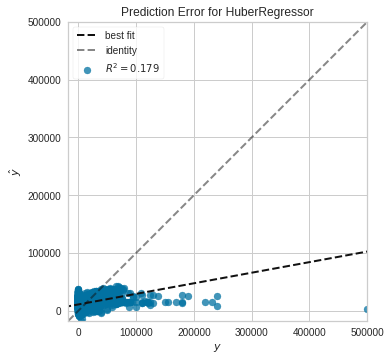

In [ ]:
plot_model(tuned_model, plot='error')

In [ ]:
predict_model(tuned_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,8361.908,2.234557e+08,14948.4354,0.1793,2.6088,62.7648


,region,year,manufacturer,model_name,odometer,state,latitude,longitude,car_condition_excellent,car_condition_fair,car_condition_good,car_condition_like new,car_condition_new,car_condition_not_available,car_condition_salvage,#cylinders_10 cylinders,#cylinders_12 cylinders,#cylinders_3 cylinders,#cylinders_4 cylinders,#cylinders_5 cylinders,#cylinders_6 cylinders,#cylinders_8 cylinders,#cylinders_not_available,#cylinders_other,fuel_type_diesel,fuel_type_electric,fuel_type_gas,fuel_type_hybrid,fuel_type_not_available,fuel_type_other,title_status_clean,title_status_lien,title_status_missing,title_status_not_available,title_status_parts only,title_status_rebuilt,title_status_salvage,transmission_automatic,transmission_manual,transmission_not_available,transmission_other,drive_4wd,drive_fwd,drive_not_available,drive_rwd,size_compact,size_full-size,size_mid-size,size_not_available,size_sub-compact,car_type_SUV,car_type_bus,car_type_convertible,car_type_coupe,car_type_hatchback,car_type_mini-van,car_type_not_available,car_type_offroad,car_type_other,car_type_pickup,car_type_sedan,car_type_truck,car_type_van,car_type_wagon,car_color_black,car_color_blue,car_color_brown,car_color_custom,car_color_green,car_color_grey,car_color_not_available,car_color_orange,car_color_purple,car_color_red,car_color_silver,car_color_white,car_color_yellow,price_of_car,Label
0,-0.572110,-0.293205,1.313431,1.538424,0.172727,-0.692940,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7880.0,14487.375014
1,0.576803,-0.967927,-0.999652,-0.691835,0.172727,-0.795349,-1.312126,-0.486336,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,17000.0,23155.330347
2,-0.784560,-0.740115,-0.999652,-0.689377,-2.570480,1.047610,-1.687373,1.005744,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9500.0,22676.521147
3,0.683508,-0.313631,-1.126138,-0.691835,-0.555960,0.166806,1.156655,-1.597043,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,19995.0,12850.844369
4,-0.928953,-0.967927,-1.165996,-0.691835,0.283527,-0.050859,1.121808,-0.108863,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3500.0,6415.714018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8983,-1.317456,-0.293205,1.313431,1.538424,0.172727,-0.231518,0.030935,-0.173739,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1450.0,14269.029350
8984,-0.463103,1.316849,-0.061663,-0.580929,0.430025,1.04

In [ ]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

## Finalize the Model

In [ ]:
final_model = finalize_model(tuned_model)

In [ ]:
print(final_model)

HuberRegressor(alpha=0.01, epsilon=1.8, fit_intercept=False, max_iter=100,
               tol=1e-05, warm_start=False)


In [ ]:
FINAL_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + MODEL + '_' + UTC_TIMESTAMP
FINAL_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + MODEL

* Not sure if there are issues with putting a timestamp or a file name length constraint for cloud environments. I recall that Azure Machine Learning had an experiment name string length limit. For now, I will save the model again with a simple file name without the timestamp.

In [ ]:
save_model(final_model, FINAL_MODEL_NAME_WITHOUT_TS)

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['car_description', 'vin',
                                                        'image_url',
                                                        'region_url'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='price_of_car',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categ...
                 ('dummy', Dummify(target='price_of_car')),
                 ('fix_perfect', Remove_100(target='price_of_car')),
                 ('clean_names', Clean_Colum_Names()),
    

In [ ]:
save_model(final_model, FINAL_MODEL_NAME_WITH_TS)

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['car_description', 'vin',
                                                        'image_url',
                                                        'region_url'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='price_of_car',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categ...
                 ('dummy', Dummify(target='price_of_car')),
                 ('fix_perfect', Remove_100(target='price_of_car')),
                 ('clean_names', Clean_Colum_Names()),
    

In [ ]:
!ls

catboost_info				 dtype_mapping.json
compare_model.csv			 logs.log
create_model.csv			 mlruns
dphi_ch54_1_automl_20210210T124615.pkl	 prediction_results_automl.csv
dphi_ch54_1_automl.pkl			 prediction_results_blended.csv
dphi_ch54_1_blended_20210210T124615.pkl  prediction_results_stacked.csv
dphi_ch54_1_blended.pkl			 sample_data
dphi_ch54_1_huber_20210210T124615.pkl	 test_set_label.csv
dphi_ch54_1_huber.pkl			 training_data_profile.html
dphi_ch54_1_stacked_20210210T124615.pkl  train_set_label.csv
dphi_ch54_1_stacked.pkl			 tune_model.csv


# Load Model and Predict


In [ ]:
loaded_model = load_model(FINAL_MODEL_NAME_WITHOUT_TS)

Transformation Pipeline and Model Successfully Loaded


In [ ]:
loaded_model

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['car_description', 'vin',
                                                       'image_url',
                                                       'region_url'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='price_of_car',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categ...
                ('dummy', Dummify(target='price_of_car')),
                ('fix_perfect', Remove_100(target='price_of_car')),
                ('clean_names', Clean_Colum_Names()),
                ('fea

In [ ]:
single_example = test_data.iloc[[1],:]

In [ ]:
single_example.head()

,region,region_url,year,manufacturer,model_name,car_condition,#cylinders,fuel_type,odometer,title_status,transmission,vin,drive,size,car_type,car_color,image_url,car_description,county,state,latitude,longitude
1,east oregon,https://eastoregon.craigslist.org,1988.0,gmc,sierra,good,8 cylinders,gas,NaN,clean,manual,NaN,rwd,NaN,NaN,NaN,https://images.craigslist.org/00T0T_MVIks2Lpvx...,"Great truck, 12ft flatbed,with extra side wall...",NaN,or,44.8953,-117.113


In [ ]:
single_example.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 1 to 1
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   region           1 non-null      object 
 1   region_url       1 non-null      object 
 2   year             1 non-null      float64
 3   manufacturer     1 non-null      object 
 4   model_name       1 non-null      object 
 5   car_condition    1 non-null      object 
 6   #cylinders       1 non-null      object 
 7   fuel_type        1 non-null      object 
 8   odometer         0 non-null      float64
 9   title_status     1 non-null      object 
 10  transmission     1 non-null      object 
 11  vin              0 non-null      object 
 12  drive            1 non-null      object 
 13  size             0 non-null      object 
 14  car_type         0 non-null      object 
 15  car_color        0 non-null      object 
 16  image_url        1 non-null      object 
 17  car_description  1 n

In [ ]:
prediction = predict_model(loaded_model, data= single_example)

In [ ]:
prediction

,region,region_url,year,manufacturer,model_name,car_condition,#cylinders,fuel_type,odometer,title_status,transmission,vin,drive,size,car_type,car_color,image_url,car_description,county,state,latitude,longitude,Label
1,east oregon,https://eastoregon.craigslist.org,1988.0,gmc,sierra,good,8 cylinders,gas,NaN,clean,manual,NaN,rwd,NaN,NaN,NaN,https://images.craigslist.org/00T0T_MVIks2Lpvx...,"Great truck, 12ft flatbed,with extra side wall...",NaN,or,44.8953,-117.113,7942.624225


In [ ]:
batch_prediction = predict_model(loaded_model, data=test_data)

In [ ]:
batch_prediction

,region,region_url,year,manufacturer,model_name,car_condition,#cylinders,fuel_type,odometer,title_status,transmission,vin,drive,size,car_type,car_color,image_url,car_description,county,state,latitude,longitude,Label
0,moses lake,https://moseslake.craigslist.org,2018.0,jeep,wrangler jk unlimited 4x4,NaN,NaN,gas,44721.0,clean,automatic,1C4HJWDG5JL864603,4wd,NaN,SUV,silver,https://images.craigslist.org/00101_3TjNxXI3xz...,2018 Jeep Wrangler JK Unlimited Sport 4x4 **Cl...,NaN,wa,46.2348,-119.1280,24712.160049
1,east oregon,https://eastoregon.craigslist.org,1988.0,gmc,sierra,good,8 cylinders,gas,NaN,clean,manual,NaN,rwd,NaN,NaN,NaN,https://images.craigslist.org/00T0T_MVIks2Lpvx...,"Great truck, 12ft flatbed,with extra side wall...",NaN,or,44.8953,-117.1130,7942.624225
2,springfield,https://springfield.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mo,NaN,NaN,14757.688993
3,sacramento,https://sacramento.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ca,NaN,NaN,14766.927000
4,north mississippi,https://northmiss.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ms,NaN,NaN,14357.200458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,tulsa,https://tulsa.craigslist.org,2011.0,NaN,mazda3 hatchback,excellent,NaN,gas,105297.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,https://images.craigslist.org/00D0D_gLEW2yTGbe...,zero down $139 per month. 2011 mazda mazda3 gr...,NaN,ok,35.9908,-95.8864,10744.654574
12496,ventura county,https://ventura.craigslist.org,2009.0,bmw,335i sedan,good,6 cylinders,gas,178500.0,clean,automatic,NaN,NaN,NaN,NaN,blue,https://images.craigslist.org/01313_blC2SO05ef...,Montego Blue Metallic with Dakota leather inte...,NaN,ca,34.2164,-118.8820,7417.234385
12497,baton rouge,https://batonrouge.craigslist.org,2018.0,chevrolet,silverado 3500hd cc,NaN,8 cylinders,diesel,95055.0,clean,automatic,1GB4KYCY8JF121647,4wd,full-size,truck,white,https://images.craigslist.org/00O0O_8zAQgRQ7G0...,DKR IncAsk for: Paul or Randy☎ (817) 239-73531...,NaN,la,32.7540,-97.1348,33053.260729
12498,sacramento,https://sacramento.craigslist.org,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ca,NaN,NaN,14766.927000


In [ ]:
submission = batch_prediction[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results.csv', index=False)

In [ ]:
logs = get_logs(save=True)
logs.head()

,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.MSE,metrics.MAPE,metrics.R2,metrics.TT,metrics.MAE,metrics.RMSE,metrics.RMSLE,params.tol,params.max_iter,params.warm_start,params.alpha,params.epsilon,params.fit_intercept,params.huber__tol,params.par__early_stopping,params.huber__warm_start,params.par__average,params.huber__epsilon,params.en,params.par__warm_start,params.par__max_iter,params.weight_2,params.en__precompute,params.en__normalize,params.weights,params.en__warm_start,params.par__epsilon,params.en__positive,params.par__fit_intercept,params.en__fit_intercept,params.par__n_iter_no_change,params.en__random_state,params.huber__fit_intercept,params.verbose,...,params.Transformed Test Set,params.Transform Target,params.Transform Target Method,params.session_id,params.Features Selection Threshold,params.Feature Interaction,params.Polynomial Threshold,params.Fold Generator,params.Fold Number,params.Feature Selection,params.Target,params.Log Experiment,params.Unknown Categoricals Handling,params.Iterative Imputation Categorical Model,params.Transformation Method,params.Clustering,params.Group Features,params.Remove Multicollinearity,params.Transformation,params.Rare Level Threshold,params.Imputation Type,params.Stratify Train-Test,params.High Cardinality Method,params.Remove Outliers,params.Transformed Train Set,params.Original Data,params.PCA Components,params.Experiment Name,params.Shuffle Train-Test,params.USI,tags.Source,tags.mlflow.source.name,tags.mlflow.source.type,tags.Run Time,tags.mlflow.runName,tags.Run ID,tags.URI,tags.mlflow.log-model.history,tags.mlflow.user,tags.USI
0,d3cfc64d712f496f99cc7d012256ec53,1,FINISHED,file:///content/mlruns/1/d3cfc64d712f496f99cc7...,2021-02-10 13:18:03.408000+00:00,2021-02-10 13:18:05.692000+00:00,1.505095e+10,59.469400,0.137700,4.86,9475.64070,65674.812800,2.698600,1e-05,100,False,0.01,1.8,False,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,finalize_model,/usr/local/lib/python3.6/dist-packages/ipykern...,LOCAL,28.23,Huber Regressor,d3cfc64d712f496f99cc7d012256ec53,de518ef1,"[{""run_id"": ""d3cfc64d712f496f99cc7d012256ec53""...",root,a0d4
1,c8b75bc8a2a34ba9ae0c827c5947829e,1,FINISHED,file:///content/mlruns/1/c8b75bc8a2a34ba9ae0c8...,2021-02-10 13:17:31.127000+00:00,2021-02-10 13:17:33.421000+00:00,2.140063e+10,57.373400,0.129600,2.95,9955.22880,76823.141700,2.733900,1e-05,100,False,0.01,1.8,False,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,tune_model,/usr/local/lib/python3.6/dist-packages/ipykern...,LOCAL,130.55,Huber Regressor,c8b75bc8a2a34ba9ae0c827c5947829e,5977ce2c,"[{""run_id"": ""c8b75bc8a2a34ba9ae0c827c5947829e""...",root,a0d4
2,f142ac480b344efe8ef1a8656ca56c2f,1,FINISHED,file:///content/mlruns/1/f142ac480b344efe8ef1a...,2021-02-10 13:15:17.821000+00:00,2021-02-10 13:15:20.157000+00:00,2.140115e+10,56.328909,0.120714,3.62,9884.78327,76908.593466,2.736067,1e-05,100,False,0.0001,1.35,True,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,create_model,/usr/local/lib/python3.6/dist-packages/ipykern...,LOCAL,19.28,Huber Regressor,f142ac480b344efe8ef1a8656ca56c2f,adcb71f5,"[{""run_id"": ""f142ac480b344efe8ef1a8656ca56c2f""...",root,a0d4
3,b45c9a572b1f47c1882079867df1e2d7,1,FINISHED,file:///content/mlruns/1/b45c9a572b1f47c188207...,2021-02-10 13:14:46.944000+00:00,2021-02-10 13:14:49.032000+00:00,1.504735e+10,62.795500,0.132900,4.26,9618.

# Capture Schema Information



In [ ]:
import json

def schema_to_json(df, filename_prefix):
  '''
  Adapted from
  Source: https://stackoverflow.com/questions/50422404/save-and-export-dtypes-information-of-a-python-pandas-dataframe
  '''
  columns_filename = filename_prefix + '_columns.json'
  df.head(0).to_json(columns_filename)

  tmp = df.dtypes.to_frame('dtypes').reset_index()
  df_dtypes = tmp.set_index('index')['dtypes'].astype(str).to_dict()
  dtypes_filename = filename_prefix + '_dtypes.json'
  with open(dtypes_filename, 'w') as f:
    json.dump(df_dtypes, f)

In [ ]:
schema_to_json(training_data, 'training_data')
schema_to_json(test_data, 'test_data')

# Capture Package Versions


In [ ]:
'''
Adapted from
Source: https://stackoverflow.com/questions/40428931/package-for-listing-version-of-packages-used-in-a-jupyter-notebook
'''
package_versions = {m.__name__ : m.__version__ for m in globals().values() if getattr(m, '__version__', None)}
with open('notebook_package_versions.json','w') as f:
  json.dump(package_versions, f)

# Bundle Outputs and Download

In [ ]:
# Google Colab places a folder of sample data in sample_data. We don't need that.
!rm -rf sample_data ||:

In [ ]:
ZIP_ARCHIVE_NAME = FINAL_MODEL_NAME_WITH_TS + '.zip'

In [ ]:
!zip -qr ./$ZIP_ARCHIVE_NAME ./

In [ ]:
if DOWNLOAD_ZIPFILE:
  files.download(ZIP_ARCHIVE_NAME)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>